**Do the codeing here**

So i will be creating the sections so you can add code  and you can perform the visualization

In [1]:
#Alex---u can keep on adding the code bock if required

In [2]:
#Liu

In [3]:
#Kp

Yathin Burugamakaalli shivanna

In [4]:
#Importing the necessary packages
import pandas as pd
from collections import Counter
import matplotlib.pyplot as plt
import plotly.express as px
import IPython.display as ipd
import networkx as nx
from pyvis.network import Network

In [5]:
#Reading the Data File
#Authors_Data where it contains the authors name and afflication
#Articles_Data contains the area of the intrest,journal,articles.....

papercount_Data = pd.read_csv(r"C:\Users\YATHIN REDDY\Desktop\Skill Assesment 2\Skill_Assesment\paper_counts.csv")
Authors_Data  = pd.read_csv(r"C:\Users\YATHIN REDDY\Desktop\Skill Assesment 2\Skill_Assesment\authors.schistosomiasis.csv")
Articles_Data =  pd.read_csv(r"C:\Users\YATHIN REDDY\Desktop\Skill Assesment 2\Skill_Assesment\articles.schistosomiasis.csv")
ipd.display(Authors_Data)

,PMID,AuthorN,AuthorForename,AuthorLastname,AuthorInitials,AuthorAffiliation
0,10543349,1,M,Divizia,M,"Department of Public Health, University of Tor..."
1,10543349,2,R,Gabrieli,R,NaN
2,10543349,3,M L,Stefanoni,ML,NaN
3,10543349,4,E,Renganathan,E,NaN
4,10543349,5,E,El Ghazzawi,E,NaN
...,...,...,...,...,...,...
60040,38095735,3,Bianca Manuela M,Baldonado,BMM,"Department of Biological Sciences, College of ..."
60041,38095735,4,Rica Nikki B,Bilasano,RNB,"Department of Biological Sciences, College of ..."
60042,38095735,5,Sophia Miel L,Dullano,SML,"Department of Biological Sciences, College of ..."
60043,38095735,6,Justine Marie R,Molo,JMR,"Department of Biological Sciences, College of ..."


In [6]:
#In Authors Data AuthorsAffiliation is not filled
#Since consdering the same PMID we can do fillforward method to fill the Author afflilation
Authors_Data['AuthorAffiliation'] = Authors_Data['AuthorAffiliation'].ffill()
ipd.display(Authors_Data)


,PMID,AuthorN,AuthorForename,AuthorLastname,AuthorInitials,AuthorAffiliation
0,10543349,1,M,Divizia,M,"Department of Public Health, University of Tor..."
1,10543349,2,R,Gabrieli,R,"Department of Public Health, University of Tor..."
2,10543349,3,M L,Stefanoni,ML,"Department of Public Health, University of Tor..."
3,10543349,4,E,Renganathan,E,"Department of Public Health, University of Tor..."
4,10543349,5,E,El Ghazzawi,E,"Department of Public Health, University of Tor..."
...,...,...,...,...,...,...
60040,38095735,3,Bianca Manuela M,Baldonado,BMM,"Department of Biological Sciences, College of ..."
60041,38095735,4,Rica Nikki B,Bilasano,RNB,"Department of Biological Sciences, College of ..."
60042,38095735,5,Sophia Miel L,Dullano,SML,"Department of Biological Sciences, College of ..."
60043,38095735,6,Justine Marie R,Molo,JMR,"Department of Biological Sciences, College of ..."


In [7]:
#As mentioned, we will be consdering the Authors last name and the Autors initials as his full name

Authors_Data['Author Name'] =   Authors_Data['AuthorLastname'] +' '+ Authors_Data['AuthorInitials']

# Printing the updated DataFrame
ipd.display(Authors_Data)





,PMID,AuthorN,AuthorForename,AuthorLastname,AuthorInitials,AuthorAffiliation,Author Name
0,10543349,1,M,Divizia,M,"Department of Public Health, University of Tor...",Divizia M
1,10543349,2,R,Gabrieli,R,"Department of Public Health, University of Tor...",Gabrieli R
2,10543349,3,M L,Stefanoni,ML,"Department of Public Health, University of Tor...",Stefanoni ML
3,10543349,4,E,Renganathan,E,"Department of Public Health, University of Tor...",Renganathan E
4,10543349,5,E,El Ghazzawi,E,"Department of Public Health, University of Tor...",El Ghazzawi E
...,...,...,...,...,...,...,...
60040,38095735,3,Bianca Manuela M,Baldonado,BMM,"Department of Biological Sciences, College of ...",Baldonado BMM
60041,38095735,4,Rica Nikki B,Bilasano,RNB,"Department of Biological Sciences, College of ...",Bilasano RNB
60042,38095735,5,Sophia Miel L,Dullano,SML,"Department of Biological Sciences, College of ...",Dullano SML
60043,38095735,6,Justine Marie R,Molo,JMR,"Department of Biological Sciences, College of ...",Molo JMR


In [8]:
#Dropping the coloumns of the Author forename ,lastname,initials
Authors_Data.drop(columns=['AuthorForename','AuthorLastname','AuthorInitials'],axis=1,inplace = True)
ipd.display(Authors_Data)
Authors_Data.to_csv(r"C:\Users\YATHIN REDDY\Desktop\author_Data_clean.csv", sep=',', index=False, encoding='utf-8')

,PMID,AuthorN,AuthorAffiliation,Author Name
0,10543349,1,"Department of Public Health, University of Tor...",Divizia M
1,10543349,2,"Department of Public Health, University of Tor...",Gabrieli R
2,10543349,3,"Department of Public Health, University of Tor...",Stefanoni ML
3,10543349,4,"Department of Public Health, University of Tor...",Renganathan E
4,10543349,5,"Department of Public Health, University of Tor...",El Ghazzawi E
...,...,...,...,...
60040,38095735,3,"Department of Biological Sciences, College of ...",Baldonado BMM
60041,38095735,4,"Department of Biological Sciences, College of ...",Bilasano RNB
60042,38095735,5,"Department of Biological Sciences, College of ...",Dullano SML
60043,38095735,6,"Department of Biological Sciences, College of ...",Molo JMR


In [9]:
#Displaying the Articles.csv

ipd.display(Articles_Data)

#So in this data First Author affiliation is given and along with the first names

,PMID,Title,Abstract,ISSN,Journal,Location,Year,FirstAuthorForename,FirstAuthorLastname,FirstAuthorInitials,FirstAuthorAffiliation
0,10543349,HAV and HEV infection in hospitalised hepatiti...,A total of 202 serum and stool samples from ac...,0393-2990,European journal of epidemiology,(15) 603-9,1999,M,Divizia,M,"Department of Public Health, University of Tor..."
1,10548300,Relationship between circulating antigen level...,Ninety-eight Schistosoma mansoni-infected chil...,0002-9637,The American journal of tropical medicine and ...,(61) 635-8,1999,M M,Hassan,MM,"Department of Parasitology, Faculty of Medicin..."
2,10556825,Schistosoma mansoni schistosomula reduce E-sel...,The recruitment of immune cells into the lungs...,0014-2980,European journal of immunology,(29) 3691-701,1999,F,Trottein,F,"Centre d'Immunologie et de Biologie, Parasitai..."
3,10557147,The baboon as a non-human primate model of hum...,"Over the past three decades, intensive studies...",0169-4758,Parasitology today (Personal ed.),(15) 478-82,1999,M,Nyindo,M,"Kilimanjaro Christian Medical College (KCMC), ..."
4,10559846,Antigenic stimulation is more efficient than L...,Nitric oxide (NO) is an extremely important an...,0100-879X,Brazilian journal of medical and biological re...,(32) 1437-45,1999,D M,Oliveira,DM,"Departamento de Bioquímica e Imunologia, Insti..."
...,...,...,...,...,...,...,...,...,...,...,...
9299,38076323,Risk mapping and socio-ecological drivers of s...,The Philippines reports a high prevalence of s...,2666-6065,The Lancet regional health. Western Pacific,(43) 100974,2024,Tsheten,Tsheten,T,National Centre for Epidemiology and Populatio...
9300,38084940,Genetic difference between two Schistosoma jap...,Schistosoma japonicum is one of the major infe...,1776-1042,"Parasite (Paris, France)",(30) 59,2023,Hui-Ying,Sun,HY,"Department of Epidemiology and Statistics, Sch..."
9301,38086267,Matrix metalloproteinases inhibition reveals t...,Schistosomiasis mansoni is a parasitic infecti...,1878-1705,International immunopharmacology,(127) 111353,2023,Thiago D,Silva,TD,Programa de Pós-Graduação em Biociências Aplic...
9302,38093363,Exploring the immune interactions between Onco...,"Schistosomiasis, the second largest parasitic ...",1756-3305,Parasites & vectors,(16) 453,2023,Hongyu,Li,H,"Shulan International Medical College, Zhejiang..."


In [10]:
#Getting the author name by combining the AuthorLastname and the AutorInitials

Articles_Data['Author Name'] = Articles_Data['FirstAuthorLastname'] +' '+Articles_Data['FirstAuthorInitials'] 
ipd.display(Articles_Data)

,PMID,Title,Abstract,ISSN,Journal,Location,Year,FirstAuthorForename,FirstAuthorLastname,FirstAuthorInitials,FirstAuthorAffiliation,Author Name
0,10543349,HAV and HEV infection in hospitalised hepatiti...,A total of 202 serum and stool samples from ac...,0393-2990,European journal of epidemiology,(15) 603-9,1999,M,Divizia,M,"Department of Public Health, University of Tor...",Divizia M
1,10548300,Relationship between circulating antigen level...,Ninety-eight Schistosoma mansoni-infected chil...,0002-9637,The American journal of tropical medicine and ...,(61) 635-8,1999,M M,Hassan,MM,"Department of Parasitology, Faculty of Medicin...",Hassan MM
2,10556825,Schistosoma mansoni schistosomula reduce E-sel...,The recruitment of immune cells into the lungs...,0014-2980,European journal of immunology,(29) 3691-701,1999,F,Trottein,F,"Centre d'Immunologie et de Biologie, Parasitai...",Trottein F
3,10557147,The baboon as a non-human primate model of hum...,"Over the past three decades, intensive studies...",0169-4758,Parasitology today (Personal ed.),(15) 478-82,1999,M,Nyindo,M,"Kilimanjaro Christian Medical College (KCMC), ...",Nyindo M
4,10559846,Antigenic stimulation is more efficient than L...,Nitric oxide (NO) is an extremely important an...,0100-879X,Brazilian journal of medical and biological re...,(32) 1437-45,1999,D M,Oliveira,DM,"Departamento de Bioquímica e Imunologia, Insti...",Oliveira DM
...,...,...,...,...,...,...,...,...,...,...,...,...
9299,38076323,Risk mapping and socio-ecological drivers of s...,The Philippines reports a high prevalence of s...,2666-6065,The Lancet regional health. Western Pacific,(43) 100974,2024,Tsheten,Tsheten,T,National Centre for Epidemiology and Populatio...,Tsheten T
9300,38084940,Genetic difference between two Schistosoma jap...,Schistosoma japonicum is one of the major infe...,1776-1042,"Parasite (Paris, France)",(30) 59,2023,Hui-Ying,Sun,HY,"Department of Epidemiology and Statistics, Sch...",Sun HY
9301,38086267,Matrix metalloproteinases inhibition reveals t...,Schistosomiasis mansoni is a parasitic infecti...,1878-1705,International immunopharmacology,(127) 111353,2023,Thiago D,Silva,TD,Programa de Pós-Graduação em Biociências Aplic...,Silva TD
9302,38093363,Exploring the immune interactions between Onco...,"Schistosomiasis, the second largest parasitic ...",1756-3305,Parasites & vectors,(16) 453,2023,Hongyu,Li,H,"Shulan International Medical College, Zhejiang...",Li H


In [11]:
#Dropping the coloumns of the names like lastname,forename and initials
Articles_Data.drop(columns=['FirstAuthorForename','FirstAuthorLastname','FirstAuthorInitials'],axis=1,inplace = True)
ipd.display(Articles_Data)

#Exporting the Articles Data
Articles_Data.to_csv(r"C:\Users\YATHIN REDDY\Desktop\articles_Data_clean.csv", sep=',', index=False, encoding='utf-8')

,PMID,Title,Abstract,ISSN,Journal,Location,Year,FirstAuthorAffiliation,Author Name
0,10543349,HAV and HEV infection in hospitalised hepatiti...,A total of 202 serum and stool samples from ac...,0393-2990,European journal of epidemiology,(15) 603-9,1999,"Department of Public Health, University of Tor...",Divizia M
1,10548300,Relationship between circulating antigen level...,Ninety-eight Schistosoma mansoni-infected chil...,0002-9637,The American journal of tropical medicine and ...,(61) 635-8,1999,"Department of Parasitology, Faculty of Medicin...",Hassan MM
2,10556825,Schistosoma mansoni schistosomula reduce E-sel...,The recruitment of immune cells into the lungs...,0014-2980,European journal of immunology,(29) 3691-701,1999,"Centre d'Immunologie et de Biologie, Parasitai...",Trottein F
3,10557147,The baboon as a non-human primate model of hum...,"Over the past three decades, intensive studies...",0169-4758,Parasitology today (Personal ed.),(15) 478-82,1999,"Kilimanjaro Christian Medical College (KCMC), ...",Nyindo M
4,10559846,Antigenic stimulation is more efficient than L...,Nitric oxide (NO) is an extremely important an...,0100-879X,Brazilian journal of medical and biological re...,(32) 1437-45,1999,"Departamento de Bioquímica e Imunologia, Insti...",Oliveira DM
...,...,...,...,...,...,...,...,...,...
9299,38076323,Risk mapping and socio-ecological drivers of s...,The Philippines reports a high prevalence of s...,2666-6065,The Lancet regional health. Western Pacific,(43) 100974,2024,National Centre for Epidemiology and Populatio...,Tsheten T
9300,38084940,Genetic difference between two Schistosoma jap...,Schistosoma japonicum is one of the major infe...,1776-1042,"Parasite (Paris, France)",(30) 59,2023,"Department of Epidemiology and Statistics, Sch...",Sun HY
9301,38086267,Matrix metalloproteinases inhibition reveals t...,Schistosomiasis mansoni is a parasitic infecti...,1878-1705,International immunopharmacology,(127) 111353,2023,Programa de Pós-Graduação em Biociências Aplic...,Silva TD
9302,38093363,Exploring the immune interactions between Onco...,"Schistosomiasis, the second largest parasitic ...",1756-3305,Parasites & vectors,(16) 453,2023,"Shulan International Medical College, Zhejiang...",Li H


In [12]:
#Merging the Articles data and Author data through the PMID


Authors_Articles_Data = Articles_Data.merge(Authors_Data , on="PMID" )
print("Merging the Data")
ipd.display(Authors_Articles_Data)

Authors_Articles_Data.to_csv(r"C:\Users\YATHIN REDDY\Desktop\arctiles_authors_clean.csv", sep=',', index=False, encoding='utf-8')

#So here we can see the people whom is workong with whom in Author Name_x and Author Name_y 

Merging the Data


,PMID,Title,Abstract,ISSN,Journal,Location,Year,FirstAuthorAffiliation,Author Name_x,AuthorN,AuthorAffiliation,Author Name_y
0,10543349,HAV and HEV infection in hospitalised hepatiti...,A total of 202 serum and stool samples from ac...,0393-2990,European journal of epidemiology,(15) 603-9,1999,"Department of Public Health, University of Tor...",Divizia M,1,"Department of Public Health, University of Tor...",Divizia M
1,10543349,HAV and HEV infection in hospitalised hepatiti...,A total of 202 serum and stool samples from ac...,0393-2990,European journal of epidemiology,(15) 603-9,1999,"Department of Public Health, University of Tor...",Divizia M,2,"Department of Public Health, University of Tor...",Gabrieli R
2,10543349,HAV and HEV infection in hospitalised hepatiti...,A total of 202 serum and stool samples from ac...,0393-2990,European journal of epidemiology,(15) 603-9,1999,"Department of Public Health, University of Tor...",Divizia M,3,"Department of Public Health, University of Tor...",Stefanoni ML
3,10543349,HAV and HEV infection in hospitalised hepatiti...,A total of 202 serum and stool samples from ac...,0393-2990,European journal of epidemiology,(15) 603-9,1999,"Department of Public Health, University of Tor...",Divizia M,4,"Department of Public Health, University of Tor...",Renganathan E
4,10543349,HAV and HEV infection in hospitalised hepatiti...,A total of 202 serum and stool samples from ac...,0393-2990,European journal of epidemiology,(15) 603-9,1999,"Department of Public Health, University of Tor...",Divizia M,5,"Department of Public Health, University of Tor...",El Ghazzawi E
...,...,...,...,...,...,...,...,...,...,...,...,...
60078,38095735,Predicting the potential nationwide distributi...,Schistosomiasis remains a major public health ...,1432-1955,Parasitology research,(123) 41,2023,"Department of Biological Sciences, College of ...",Recopuerto-Medina LM,3,"Department of Biological Sciences, College of ...",Baldonado BMM
60079,38095735,Predicting the potential nationwide distributi...,Schistosomiasis remains a major public health ...,1432-1955,Parasitology research,(123) 41,2023,"Department of Biological Sciences, College of ...",Recopuerto-Medina LM,4,"Department of Biological Sciences, College of ...",Bilasano RNB
60080,38095735,Predicting the potential nationwide distributi...,Schistosomiasis remains a major public health ...,1432-1955,Parasitology research,(123) 41,2023,"Department of Biological Sciences, College of ...",Recopuerto-Medina LM,5,"Department of Biological Sciences, College of ...",Dullano SML
60081,38095735,Predicting the potential nationwide distributi...,Schistosomiasis remains a major public health ...,1432-1955,Parasitology research,(123) 41,2023,"Department of Biological Sciences, College of ...",Recopuerto-Medina LM,6,"Department of Biological Sciences, College of ...",Molo JMR


In [13]:
#Displaying the Authors_Articles_Data

Authors_Articles_Data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 60083 entries, 0 to 60082
Data columns (total 12 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   PMID                    60083 non-null  int64 
 1   Title                   60083 non-null  object
 2   Abstract                60083 non-null  object
 3   ISSN                    60083 non-null  object
 4   Journal                 60083 non-null  object
 5   Location                60057 non-null  object
 6   Year                    60083 non-null  int64 
 7   FirstAuthorAffiliation  56643 non-null  object
 8   Author Name_x           59961 non-null  object
 9   AuthorN                 60083 non-null  int64 
 10  AuthorAffiliation       60083 non-null  object
 11  Author Name_y           59968 non-null  object
dtypes: int64(3), object(9)
memory usage: 5.5+ MB


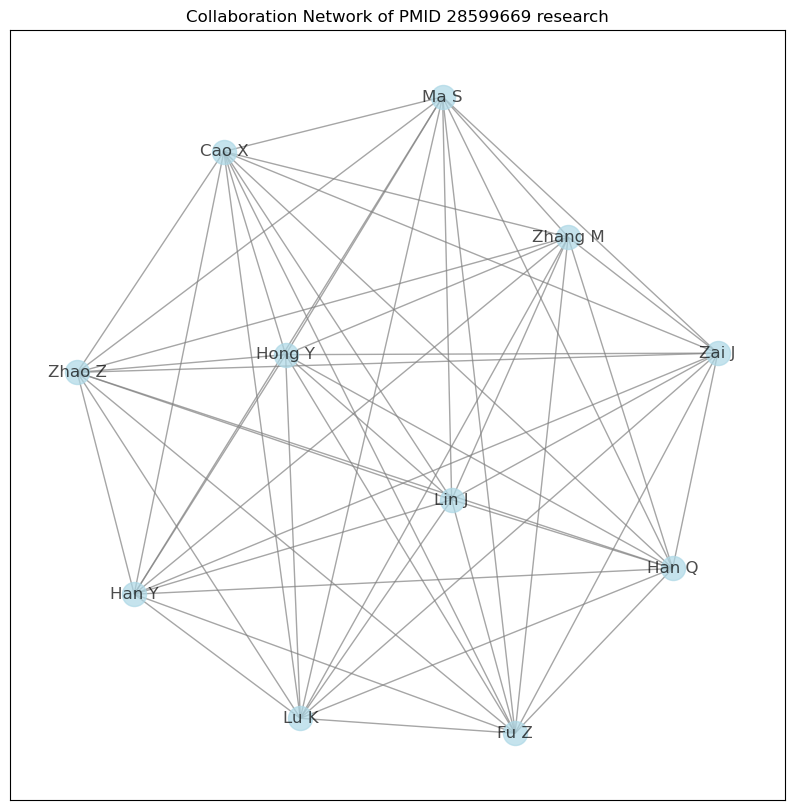

In [14]:
#Example like focusing on the particular pmid that who are the people collaborated for this particular research
#pmid random selection
pmid = Authors_Articles_Data['PMID'].sample()


#Getting the values of tat particular PMID
pmid_data = Authors_Articles_Data[Authors_Articles_Data['PMID'] == pmid.values[0]]

# Getting the Author names
Authors = pmid_data['Author Name_y'].unique().tolist()

# Creating an empty graph
graph = nx.Graph()

# Adding nodes for the authors
for author in Authors:
    graph.add_node(author)

# Adding edges between authors
for i in range(len(Authors)):
    for j in range(i + 1, len(Authors)):
        graph.add_edge(Authors[i], Authors[j])

# Plotting the network graph
plt.figure(figsize=(10,10))
pos = nx.spring_layout(graph, seed=42)
nx.draw_networkx(graph, pos=pos, with_labels=True, node_color='lightblue', edge_color='gray', alpha=0.7)
plt.title(f'Collaboration Network of PMID {pmid.values[0]} research')
plt.show()

In [15]:
#Getting the top active authors

# Filtering out null rows
filtered_data = Authors_Articles_Data.dropna(subset=['Author Name_y'])

# Counting the number of collaborations per author
collaborations_count = Counter([author for sublist in filtered_data.groupby('PMID')['Author Name_y'].apply(list) for author in sublist])

# Selecting the top 10 Active authors
top_10_activeresearcher = collaborations_count.most_common(10)

# Extracting the names of the authors
top_10_activeresearcher = [author for author, count in top_10_activeresearcher]

# Printing the names of the top 10 Active autors
print("Names of the top 10 Active Authors:")
for collaborator in top_10_activeresearcher:
    print(collaborator)

Names of the top 10 Active Authors:
Zhou XN
Utzinger J
McManus DP
Xu J
Zhang Y
Stothard JR
Li Y
Rollinson D
Li SZ
Wang Y


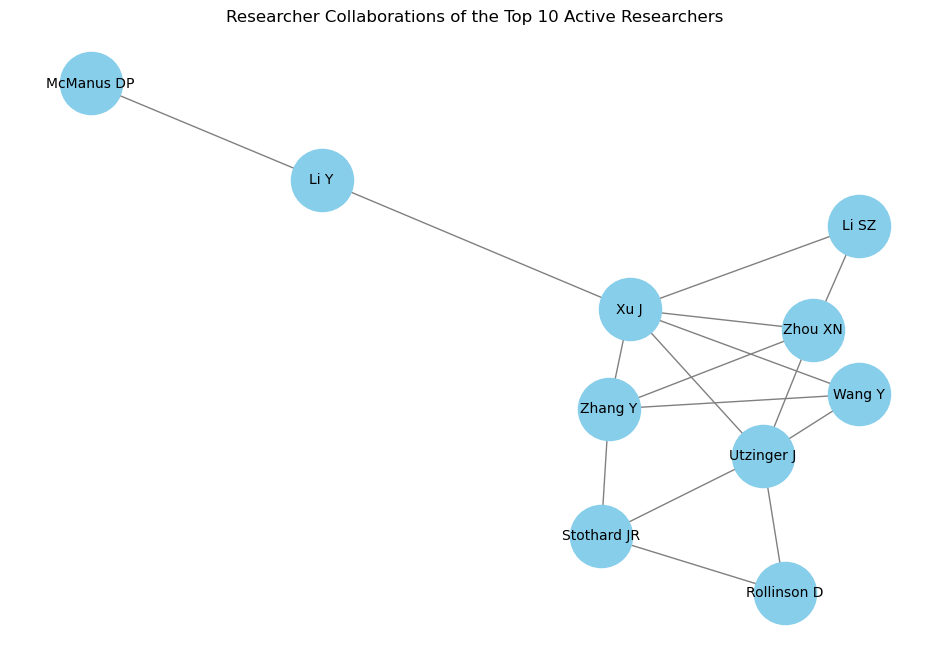

In [16]:


# Specify the researchers 
researchers = top_10_activeresearcher
# Extracting the Author names
authors_collaboration = Authors_Articles_Data[['Author Name_x', 'Author Name_y']]

# Filtering out missing values in author names
authors_collaboration = authors_collaboration.dropna()

# Creating a dictionary to store collaborations
collaborations = {}

# Iterating over each row in the DataFrame
for _, row in authors_collaboration.iterrows():
    author1 = row['Author Name_x']
    author2 = row['Author Name_y']

    # Checking if the researchers are in the list of interest
    if author1 in researchers and author2 in researchers:
        # Storing the collaborations
        if author1 not in collaborations:
            collaborations[author1] = set()
        if author2 not in collaborations:
            collaborations[author2] = set()

        # Eliminating the same names in the collaborators
        if author2 != author1:
            collaborations[author1].add(author2)
            collaborations[author2].add(author1)

# Creating a graph object
G = nx.Graph()

# Adding nodes to the graph
for researcher, collaborators in collaborations.items():
    G.add_node(researcher)

    # Add edges between collaborators
    for collaborator in collaborators:
        G.add_edge(researcher, collaborator)

# Drawing the network graph
plt.figure(figsize=(12, 8))
pos = nx.spring_layout(G)
nx.draw_networkx(G, pos, with_labels=True, node_size=2000, node_color='skyblue', edge_color='gray', font_size=10)
plt.title("Researcher Collaborations of the Top 10 Active Researchers")
plt.axis('off')
plt.show()

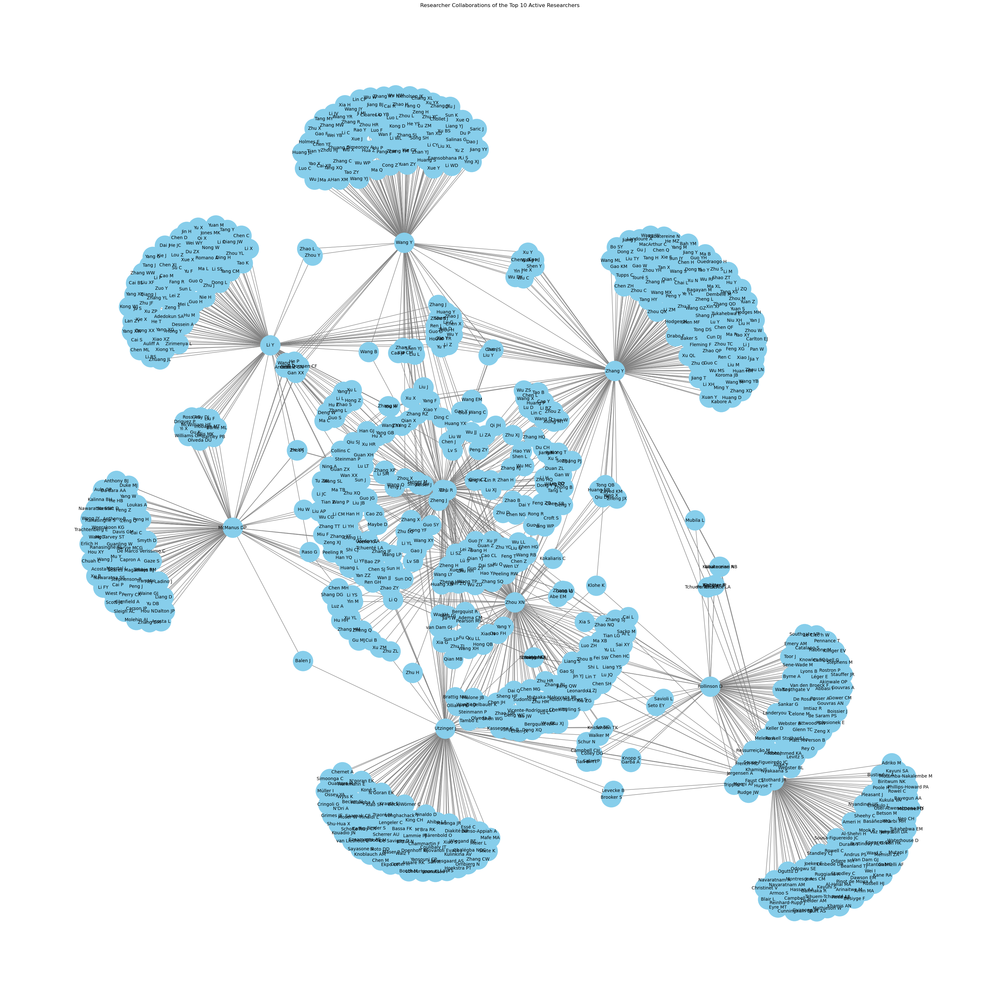

In [17]:


# Top 10 active researchers and who are the collaborators working with them
researchers = top_10_activeresearcher

# Extracting the Author names
authors_collaboration = Authors_Articles_Data[['Author Name_x', 'Author Name_y']]

# Filtering out missing values in author names
authors_collaboration = authors_collaboration.dropna()

# Creating a dictionary to store collaborations
collaborations = {}

# Iterating over each row in the DataFrame
for _, row in authors_collaboration.iterrows():
    author1 = row['Author Name_x']
    author2 = row['Author Name_y']

    # Checking if at least one author is in the list of interest
    if author1 in researchers or author2 in researchers:
        # Storing the collaborations
        if author1 not in collaborations:
            collaborations[author1] = set()
        if author2 not in collaborations:
            collaborations[author2] = set()

        # Eliminating the same names in the collaborators
        if author2 != author1:
            collaborations[author1].add(author2)
            collaborations[author2].add(author1)

# Creating a graph object
G = nx.Graph()

# Adding nodes to the graph
for researcher, collaborators in collaborations.items():
    G.add_node(researcher)

    for collaborator in collaborators:
        G.add_edge(researcher, collaborator)

# Plotting the network graph
plt.figure(figsize=(40, 40))
pos = nx.spring_layout(G)
nx.draw_networkx(G, pos, with_labels=True, node_size=2000, node_color='skyblue', edge_color='gray', font_size=10)
plt.title("Researcher Collaborations of the Top 10 Active Researchers")
plt.axis('off')
plt.show()


# Creating a Pyvis Network instance
nt = Network(height="100%", width="100%", bgcolor="#222222", font_color="white")

# Adding nodes and edges to the network
for researcher, collaborators in collaborations.items():
    nt.add_node(researcher, label=researcher)

# Adding edges only if both source and target nodes exist
for researcher, collaborators in collaborations.items():
    for collaborator in collaborators:
        if nt.get_node(researcher) and nt.get_node(collaborator):
            nt.add_edge(researcher, collaborator)

# Setting the physics layout of the network
nt.force_atlas_2based()

# Saving the HTML file
nt.write_html("researcher_collaborations_top_10_active_authors.html")

# Appending CSS styles to the HTML file
with open("researcher_collaborations_top_10_active_authors.html", "a") as f:
    css_styles = """
    <style>
    body {
        margin: 0;
        padding: 0;
        overflow: hidden;
    }
    #mynetwork {
        width: 100%;
        height: 100vh;  
    }
    </style>
    """
    f.write(css_styles)

In [18]:
#Dataset creation who is working with whom

# Extracting the Author names 
authors_collaboration = Authors_Articles_Data[['Author Name_x', 'Author Name_y']]

# Filtering out missing values in author names
authors_collaboration = authors_collaboration.dropna()

# Creating a dictionary to store collaborations
collaborations = {}

# Iterating over each row in the DataFrame
for _, row in authors_collaboration.iterrows():
    author1 = row['Author Name_x']
    author2 = row['Author Name_y']
    
    # Storing the collaborations
    if author1 not in collaborations:
        collaborations[author1] = set()
    if author2 not in collaborations:
        collaborations[author2] = set()
        
    # Eliminating the same names in the collaborators
    if author2 != author1:
        collaborations[author1].add(author2)
        collaborations[author2].add(author1)

# Printing the collaborations
print("Collaborations:")
for researcher, collaborators in collaborations.items():
    print(researcher, "->", ", ".join(collaborators))

Collaborations:
Divizia M -> Stefanoni ML, El Ghazzawi E, Saleh E, El Sawaf G, Noce A, Zaratti L, Renganathan E, Gabrieli R, Degener AM, Panà A, Gamil F, El Sherbini E, Kader OA, Modesti A
Gabrieli R -> Divizia M
Stefanoni ML -> Divizia M
Renganathan E -> Divizia M, Savioli L
El Ghazzawi E -> Divizia M
Kader OA -> Divizia M
Gamil F -> Divizia M, Habib M
El Sawaf G -> Divizia M
El Sherbini E -> Divizia M
Saleh E -> Divizia M, Rose MF
Degener AM -> Divizia M
Noce A -> Divizia M
Zaratti L -> Divizia M
Modesti A -> Divizia M
Panà A -> Divizia M
Hassan MM -> Ramos-Morales E, el-Badrawy el-S, Sedighi A, Romier C, Gaber OA, Jung M, Olaoye OO, Häberli C, Afify HA, Sultan M, Shalaby MM, Nassr AKh, Soliman SZ, Mattar MA, Merz A, Hegab MH, Kamel FM, el-Motaim MH, Gaafar M, Mostafa N, de Araujo ED, Keiser J, Gunning PT
Hegab MH -> Khater NM, Zamzam SM, Abdel-Fattah MM, Hassan MM, Tawfeek DM, Abdel-Rahman HM, Abdul-Fattah MM
Soliman SZ -> Hassan MM
Gaber OA -> Hassan MM
Shalaby MM -> Hassan MM
Kame

In [19]:
# Creating a dictionary to store the number of collaborators for each researcher
collaborator_counts = {researcher: len(collaborators) for researcher, collaborators in collaborations.items()}

# Sorting researchers based on the number of collaborators in descending order
sorted_researchers = sorted(collaborator_counts, key=collaborator_counts.get, reverse=True)

# Creating a list to store researchers and their number of collaborators
researcher_collaborators_list = []

# Printing the researchers and the number of collaborators in descending order
for researcher in sorted_researchers:
    researcher_collaborators_list.append((researcher, collaborator_counts[researcher]))
    print(researcher, "-> Number of Collaborators:", collaborator_counts[researcher])

# Printing the total number of researchers
num_researchers = len(sorted_researchers)
print("Total Number of Researchers:", num_researchers)

# Saving the researchers and their number of collaborators in a list
researchers_list_5 = [researcher for researcher, _ in researcher_collaborators_list][:5]
print(researchers_list_5)

# Saving the researchers and their number of collaborators in a list
researchers_list_10 = [researcher for researcher, _ in researcher_collaborators_list][:10]
print(researchers_list_10)


Xu J -> Number of Collaborators: 195
Zhang Y -> Number of Collaborators: 189
Zhou XN -> Number of Collaborators: 151
Li Y -> Number of Collaborators: 136
Wang Y -> Number of Collaborators: 134
Utzinger J -> Number of Collaborators: 123
Liu Y -> Number of Collaborators: 121
Adema CM -> Number of Collaborators: 120
Stothard JR -> Number of Collaborators: 117
McManus DP -> Number of Collaborators: 101
Zhang W -> Number of Collaborators: 95
Liu J -> Number of Collaborators: 92
Rollinson D -> Number of Collaborators: 86
Wang X -> Number of Collaborators: 86
Li H -> Number of Collaborators: 85
Chen Y -> Number of Collaborators: 84
Li J -> Number of Collaborators: 83
Wang J -> Number of Collaborators: 80
Li SZ -> Number of Collaborators: 80
Wang W -> Number of Collaborators: 79
King CH -> Number of Collaborators: 78
Zhang J -> Number of Collaborators: 75
Wang L -> Number of Collaborators: 73
Wang H -> Number of Collaborators: 72
Lin DD -> Number of Collaborators: 72
Zhou X -> Number of Collab

In [20]:
#Getting the reseachers who have no collaborator
# Creating a dictionary to store the number of collaborators for each researcher
collaborator_counts = {researcher: len(collaborators) for researcher, collaborators in collaborations.items()}

# Filtering researchers with zero collaborators
zero_collaborators = [researcher for researcher, count in collaborator_counts.items() if count == 0]

# Printing the names of researchers with zero collaborators
print(len(zero_collaborators))

162


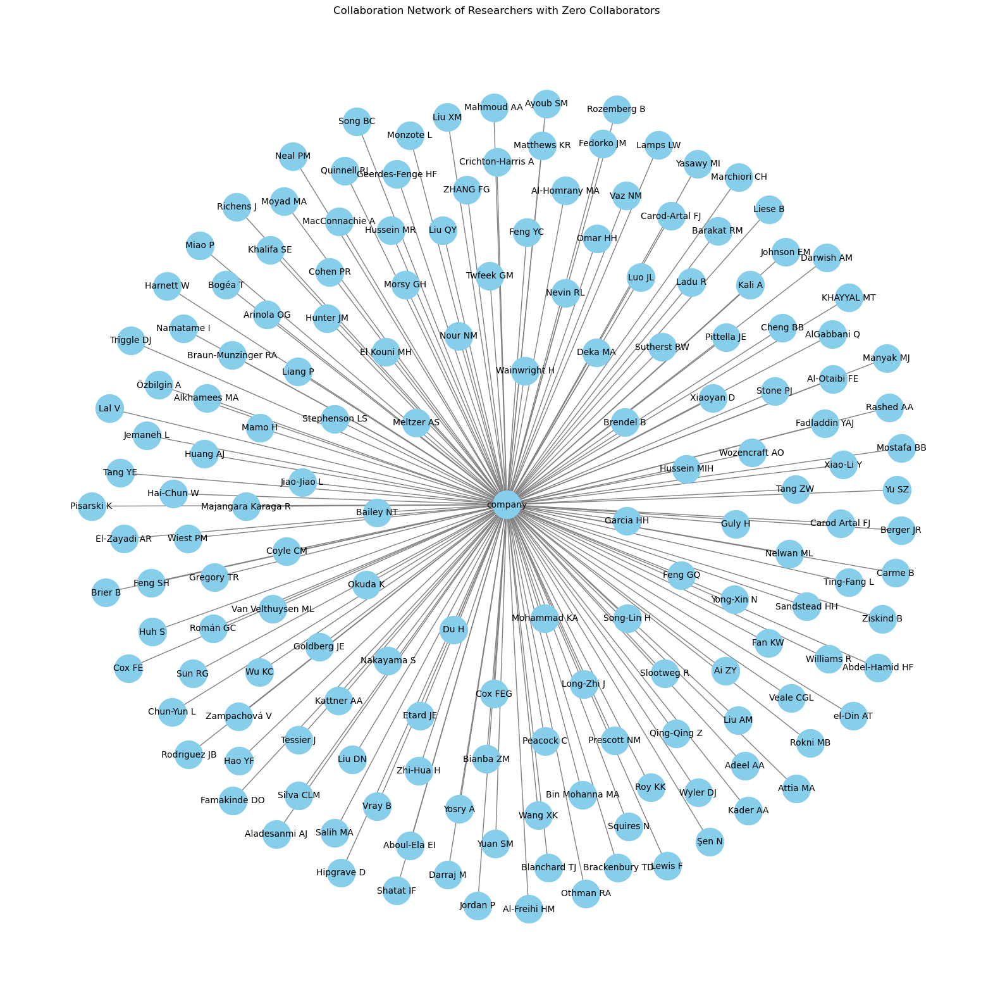

In [21]:


# Creating a subgraph with the zero collaborators and "company" node
subgraph = nx.Graph()
subgraph.add_nodes_from(zero_collaborators)
subgraph.add_node("company")

# Adding edges between "company" and zero collaborators
for researcher in zero_collaborators:
    subgraph.add_edge("company", researcher)

# Plotting the network graph
plt.figure(figsize=(20, 20))
pos = nx.spring_layout(subgraph)
nx.draw_networkx(subgraph, pos, with_labels=True, node_size=1000, node_color='skyblue', edge_color='gray', font_size=10)
plt.title("Collaboration Network of Researchers with Zero Collaborators")
plt.axis('off')
plt.show()


# Creating a Pyvis Network instance
nt = Network(height="100%", width="100%", bgcolor="#222222", font_color="white")

# Adding nodes and edges to the network
for node in subgraph.nodes:
    nt.add_node(node)

for edge in subgraph.edges:
    nt.add_edge(edge[0], edge[1])

# Setting the physics layout of the network
nt.force_atlas_2based()

# Saving the HTML file
nt.write_html("collaboration_network_zero_collaborator.html")

# Appending CSS styles to the HTML file
with open("collaboration_network_zero_collaborator.html", "a") as f:
    css_styles = """
    <style>
    body {
        margin: 0;
        padding: 0;
        overflow: hidden;
    }
    #mynetwork {
        width: 100%;
        height: 100vh; 
    }
    </style>
    """
    f.write(css_styles)


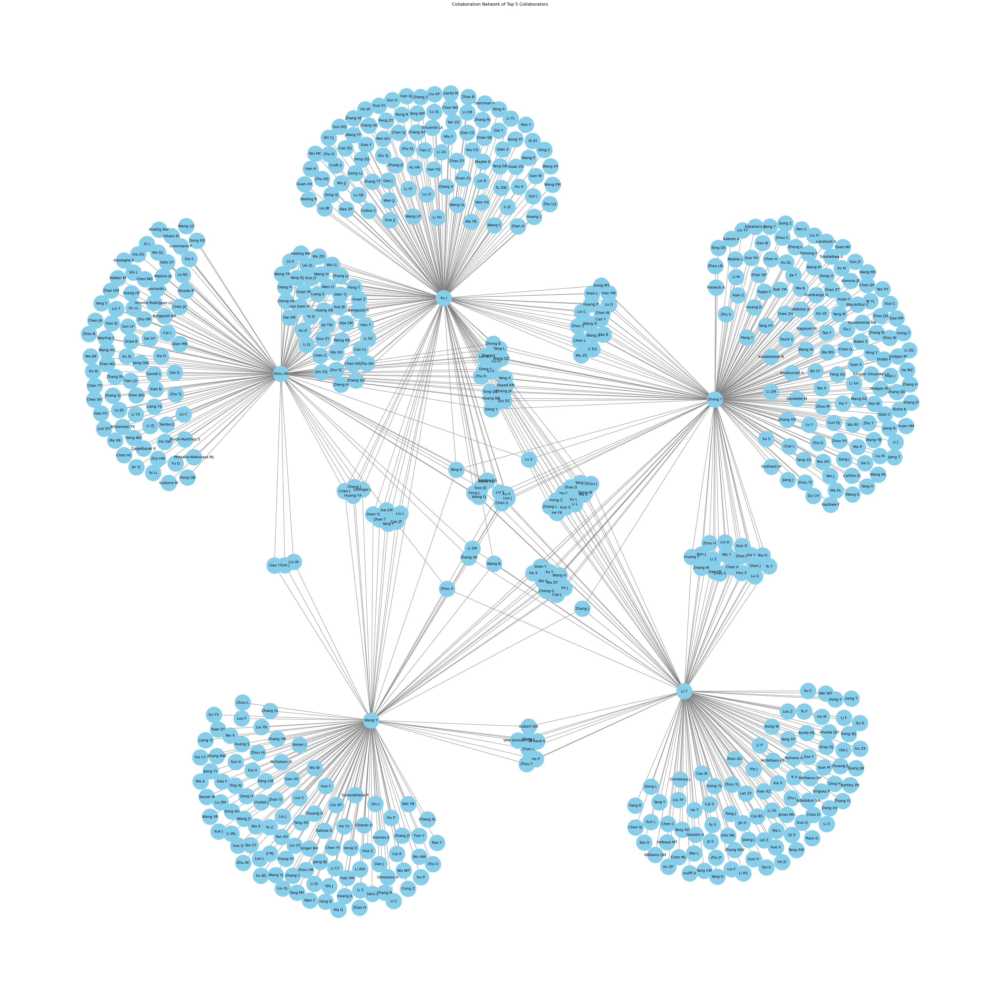

In [22]:
#This is the plot for the top 5 colloborators
# Top collaborators
top_collaborators = researchers_list_5

# Creating a dictionary to store collaborations
collaborations = {}

# Iterating over each row in the DataFrame
for _, row in authors_collaboration.iterrows():
    author1 = row['Author Name_x']
    author2 = row['Author Name_y']

    # Checking if at least one author is in the list of top collaborators
    if author1 in top_collaborators or author2 in top_collaborators:
        # Storing the collaborations
        if author1 not in collaborations:
            collaborations[author1] = set()
        if author2 not in collaborations:
            collaborations[author2] = set()

        # Eliminating the same names in the collaborators
        if author2 != author1:
            collaborations[author1].add(author2)
            collaborations[author2].add(author1)

# Creating a graph object
G = nx.Graph()

# Adding nodes to the graph
for collaborator, collaborators in collaborations.items():
    G.add_node(collaborator)

    for collaborator2 in collaborators:
        G.add_edge(collaborator, collaborator2)

# Plotting the network graph
plt.figure(figsize=(50, 50))
pos = nx.spring_layout(G)
nx.draw_networkx(G, pos, with_labels=True, node_size=2000, node_color='skyblue', edge_color='gray', font_size=10)
plt.title("Collaboration Network of Top 5 Collaborators")
plt.axis('off')
plt.show()


# Creating a Pyvis Network instance
nt = Network(height="100%", width="100%", bgcolor="#222222", font_color="white")

# Adding nodes to the network
for collaborator, collaborators in collaborations.items():
    nt.add_node(collaborator, label=collaborator)

# Adding edges to the network
for collaborator, collaborators in collaborations.items():
    for collaborator2 in collaborators:
        nt.add_edge(collaborator, collaborator2)

# Setting the physics layout of the network
nt.force_atlas_2based()

# Saving the HTML file
nt.write_html("collaboration_network_top_5_collaborators.html")

# Appending CSS styles to the HTML file
with open("collaboration_network_top_5_collaborators.html", "a") as f:
    css_styles = """
    <style>
    body {
        margin: 0;
        padding: 0;
        overflow: hidden;
    }
    #mynetwork {
        width: 100%;
        height: 100vh;  
    }
    </style>
    """
    f.write(css_styles)


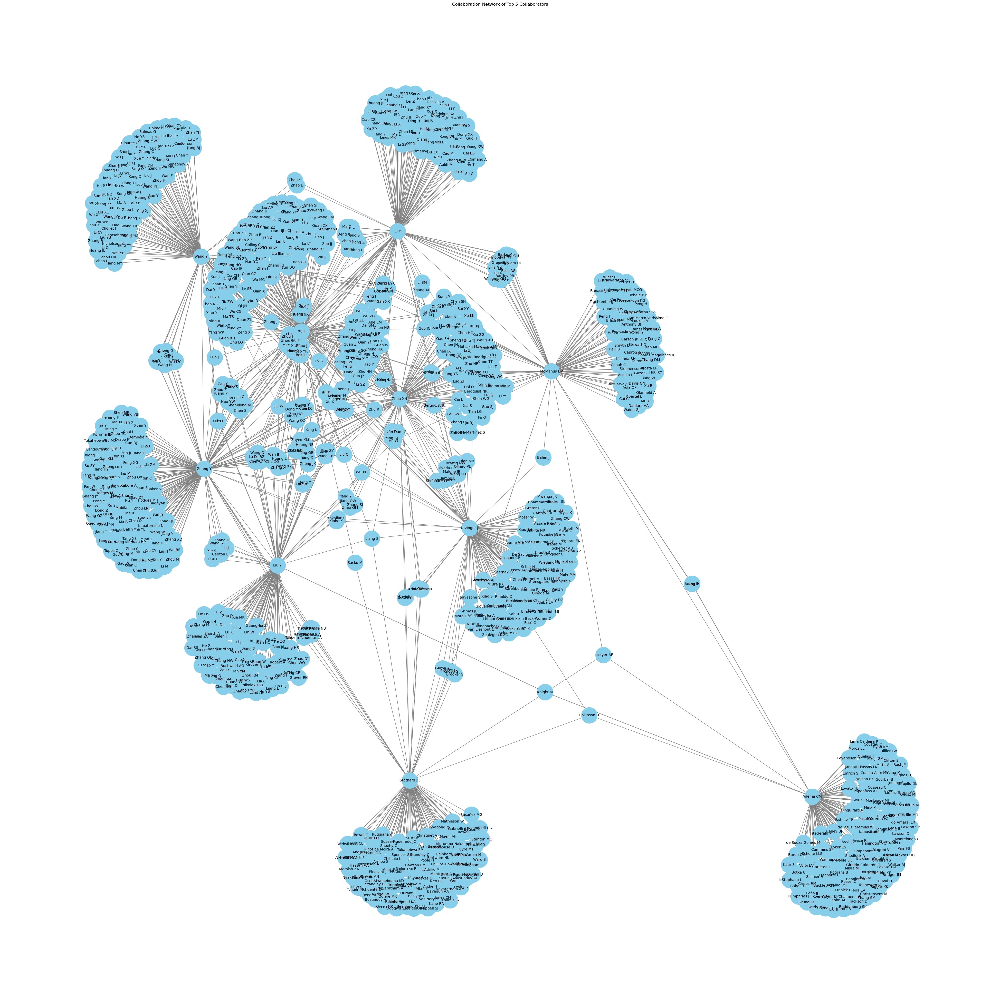

In [23]:
#This is the plot for the top 10 colloborators
# Top collaborators
top_collaborators = researchers_list_10

# Creating a dictionary to store collaborations
collaborations = {}

# Iterating over each row in the DataFrame
for _, row in authors_collaboration.iterrows():
    author1 = row['Author Name_x']
    author2 = row['Author Name_y']

    # Checking if at least one author is in the list of top collaborators
    if author1 in top_collaborators or author2 in top_collaborators:
        # Storing the collaborations
        if author1 not in collaborations:
            collaborations[author1] = set()
        if author2 not in collaborations:
            collaborations[author2] = set()

        # Eliminating the same names in the collaborators
        if author2 != author1:
            collaborations[author1].add(author2)
            collaborations[author2].add(author1)

# Creating a graph object
G = nx.Graph()

# Adding nodes to the graph
for collaborator, collaborators in collaborations.items():
    G.add_node(collaborator)

    for collaborator2 in collaborators:
        G.add_edge(collaborator, collaborator2)

# Plotting the network graph
plt.figure(figsize=(50, 50))
pos = nx.spring_layout(G)
nx.draw_networkx(G, pos, with_labels=True, node_size=2000, node_color='skyblue', edge_color='gray', font_size=10)
plt.title("Collaboration Network of Top 5 Collaborators")
plt.axis('off')
plt.show()


# Creating a Pyvis Network instance
nt = Network(height="100%", width="100%", bgcolor="#222222", font_color="white")

# Adding nodes to the network
for collaborator, collaborators in collaborations.items():
    nt.add_node(collaborator, label=collaborator)

# Adding edges to the network
for collaborator, collaborators in collaborations.items():
    for collaborator2 in collaborators:
        nt.add_edge(collaborator, collaborator2)

# Setting the physics layout of the network
nt.force_atlas_2based()

# Saving the HTML file
nt.write_html("collaboration_network_top_10_collaborators.html")

# Appending CSS styles to the HTML file
with open("collaboration_network_top_10_collaborators.html", "a") as f:
    css_styles = """
    <style>
    body {
        margin: 0;
        padding: 0;
        overflow: hidden;
    }
    #mynetwork {
        width: 100%;
        height: 100vh;  
    }
    </style>
    """
    f.write(css_styles)


In [24]:
#Visualising the top colloborators

#lets define a function


def plottingtopcolloborators(N):
    # Extracting the Author names 
    authors_collaboration = Authors_Articles_Data[['Author Name_x', 'Author Name_y']]

    # Filtering out missing values in author names
    authors_collaboration = authors_collaboration.dropna()

    # Creating a dictionary to store collaborations
    collaborations = {}

    # Iterating over each row in the DataFrame
    for _, row in authors_collaboration.iterrows():
        author1 = row['Author Name_x']
        author2 = row['Author Name_y']
    
    # Storing the collaborations
        if author1 not in collaborations:
            collaborations[author1] = set()
        if author2 not in collaborations:
            collaborations[author2] = set()
        
    # Eliminating the same names in the collaborators
        if author2 != author1:
            collaborations[author1].add(author2)
            collaborations[author2].add(author1)
            
    # Calculating the collaboration counts for each researcher using len function
    collaboration_counts = {researcher: len(collaborators) for researcher, collaborators in collaborations.items()}

    # Sorting the collaboration counts in descending order 
    #where N can change the values to top 20,top 30 etc


    #N = 30
    top_collaborators = sorted(collaboration_counts, key=collaboration_counts.get, reverse=True)[:N]

    # Creating the  network graph
    graph = nx.Graph()

    # Adding edges for collaborations of the top N collaborators
    for author1, collaborators in collaborations.items():
        if author1 in top_collaborators:
            for author2 in collaborators:
                if author2 in top_collaborators:
                    graph.add_edge(author1, author2)

    # Plotting the authors and their connections
    plt.figure(figsize=(10, 10))
    pos = nx.spring_layout(graph, seed=42)

    #connections between authors
    for author1 in top_collaborators:
        for author2 in top_collaborators:
            if author1 != author2:
                nx.draw_networkx_edges(graph, pos, edgelist=[(author1, author2)], width=1.0, alpha=0.3, edge_color='darkgray')

    nx.draw_networkx_nodes(graph, pos, node_size=700, node_color='skyblue')
    nx.draw_networkx_labels(graph, pos, font_size=8, font_color='black')

    # Highlighting the connections between authors who collaborated
    for author1, collaborators in collaborations.items():
        if author1 in top_collaborators:
            for author2 in collaborators:
                if author2 in top_collaborators:
                    nx.draw_networkx_edges(graph, pos, edgelist=[(author1, author2)], width=2.0, alpha=0.7, edge_color='black')

    plt.title(f"Connections between Top {N} Collaborators")
    plt.axis('off')
    plt.show()



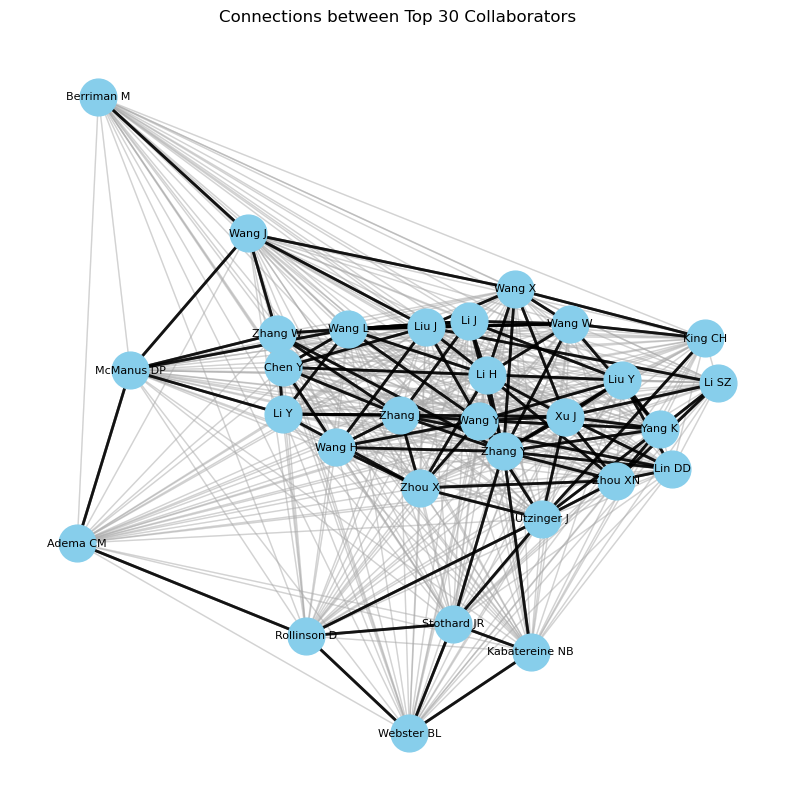

In [25]:
#Plotting the top 30 colloborator
plottingtopcolloborators(N=30)

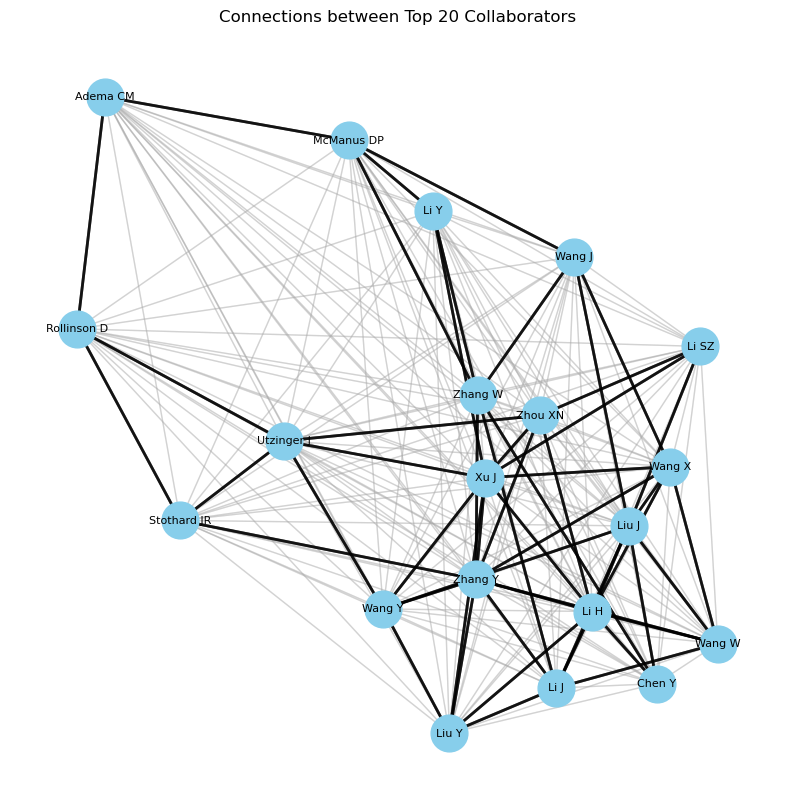

In [26]:
#Plotting the top 20 colloborator
plottingtopcolloborators(N=20)

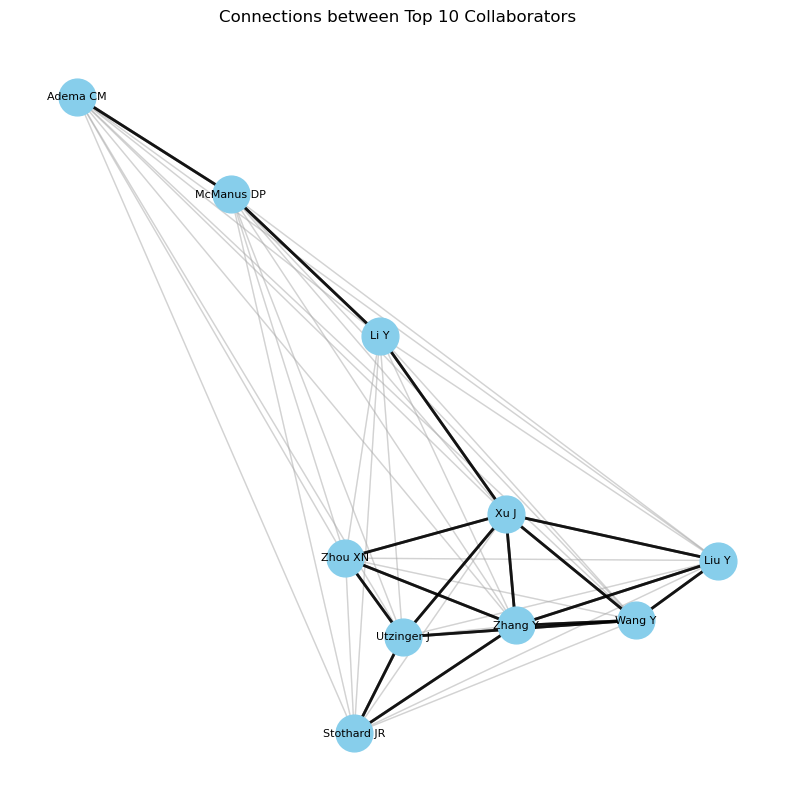

In [27]:
#Plotting the top 10 colloborator
plottingtopcolloborators(N=10)